In [219]:
import pandas as pd
import numpy as np
import classification_tools

import importlib
importlib.reload(classification_tools)

pd.set_option("display.max_columns",500)

n_jobs=16

import warnings
# suppress matplotlib warning in plot_confusion_matrix()
warnings.filterwarnings('ignore', message='FixedFormatter should only be used together with FixedLocator')



## Load Data


In [220]:
df_simd = pd.read_csv("../data/simd_2020_ward.csv", index_col=0)
df_stopsearch = pd.read_csv("../data/stop_search_clean.csv", index_col=0)
df_stopsearch = df_stopsearch.rename(columns={"Multi Member Ward":"ward_code"})

df_init = df_stopsearch.merge(right=df_simd, how="left", on="ward_code", validate="many_to_one")
df_init


,ward_code,Year,Month,Day of the Week,Time of the Day,Search Result,Nominal Age,Desc Drugs Found_Class B,Desc Drugs Found_Class C,Desc Drugs Found_Class A,Desc Off Weap Found_Other,Desc Other Items Found_Other,Desc Off Weap Found_Bladed Instrument,Desc Other Items Found_Firearms,Desc Off Weap Found_Pointed Article,Desc Other Items Found_Stolen Property,Desc Off Weap Found_Blunt Instrument,Desc Tobacco Found_Tobacco,Desc Other Items Found_Disposal Of Cash,Desc Alcohol Found_Beer,Desc Tobacco Found_Cigarette Papers,Desc Drugs Found_Nps,Desc Alcohol Found_Wine,Desc Alcohol Found_Spirits,Desc Other Items Found_Crossbows,Desc Other Items Found_Controlled Container,Desc Alcohol Found_Cider,Desc Other Items Found_Fireworks,Nominal Ethnicity_Not Provided / Unknown,Nominal Ethnicity_White British,Nominal Ethnicity_White English,Nominal Ethnicity_White Polish,Nominal Ethnicity_White Scottish,Search Statute_CONTROLLED CONTAINERS - Sec 21 Criminal Law (Consolidation) (Scotland) Act 1995,Search Statute_CONTROLLLED ARTICLE OR SUBSTANCE - Sec 21 Criminal Law (Consolidation) (Scotland) Act 1995,Search Statute_Edinburgh Airport Byelaw 9(2) (Search in interest of public safety),"Search Statute_Sec 109(1) Copyright, Designs and Patents Act 1988 (Piracy and trademark offences etc)",Search Statute_Sec 11 of the Protection of Badgers Act 1992 (Wildlife Crime),Search Statute_Sec 11A of the Fireworks Act 2003,Search Statute_Sec 19 of the Wildlife and Countryside Act 1981,Search Statute_Sec 20 & 32 Police and Fire Reform (Scotland) Act 2012 (Other),Search Statute_Sec 20 & 32 Police and Fire Reform (Scotland) Act 2012 (Protection of Life),Search Statute_Sec 23(2) of the Misuse of Drugs Act 1971 (Drugs),Search Statute_Sec 23(3) Misuse Of Drugs Act 1971,Search Statute_Sec 23A of the Misuse of Drugs Act 1971 (Drugs),"Search Statute_Sec 24(1) Forgery and Counterfeiting Act, 1981 (Search for counterfeit money)",Search Statute_Sec 27 Deer (Scotland) Act 1996,Search Statute_Sec 289 Proceeds of Crime Act 2002 (Cash),Search Statute_Sec 4 of the Crossbows Act 1987,Search Statute_Sec 46(1) Firearms Act 1968,Search Statute_Sec 47(1) Firearms Act 1968 (Firearms),Search Statute_Sec 48(1) of the Criminal Law (Consolidation) (Scotland) Act 1995 (Offensive Weapon),Search Statute_Sec 49B of the Criminal Law (Consolidation) (Scotland) Act 1995 (Bladed Weapon/Offensive Weapon Schools),Search Statute_Sec 50 of the Criminal Law (Consolidation) (Scotland) Act 1995 (Bladed Weapon),Search Statute_Sec 53(1) of The Salmon and Freshwater Fisheries (Consolidation)(Scotland) Act 2003,Search Statute_Sec 60 Criminal Justice and Public Order Act 1994,Search Statute_Sec 60(1) Civic Government (Scotland) Act 1982 (Stolen Property),Search Statute_Sec 66 Criminal Justice (Scotland) Act 2016 (Removal of person),Search Statute_Sec 7 of the Wild Mammals (Scotland) Act 2002 (Wildlife Crime),Search Statute_Warrant - Other,Nominal Gender_Male,Nominal Physical Search Type_STRIP_IS,Nominal Physical Search Type_STRIP_OS,Command Desc_3,Command Desc_East,Command Desc_North,Command Desc_West,Division Desc_13,Division Desc_Argyll and West Dunbartonshire,Division Desc_Ayrshire,Division Desc_Dumfries and Galloway,Division Desc_Edinburgh,Division Desc_Fife,Division Desc_Forth Valley,Division Desc_Greater Glasgow,Division Desc_Highland and Islands,Division Desc_Lanarkshire,Division Desc_North East,Division Desc_Renfrewshire and Inverclyde,Division Desc_Tayside,Division Desc_The Lothians and Scottish Borders,Area Command Desc_71,Area Command Desc_Aberdeen North - AK,Area Command Desc_Aberdeen South - AU,Area Command Desc_Aberdeenshire North - AP,Area Command Desc_Aberdeenshire South - AV,Area Command Desc_Angus - DE,Area Command Desc_Central Fife - PA,Area Command Desc_Clackmannanshire - CA,Area Command Desc_Clydesdale - QC,"Area Command Desc_Cowal, Bute & Helensburgh - LD",Area Command Desc_Cumbernauld - QJ,Area Command Desc_Dumfriesshire - VA,Area Command Desc_Dundee City - DC,Area Command Desc_East Ayrs

In [221]:
label = "Search Result"
s_labels = df_init[label]
df_init = df_init.drop(label, axis=1)
df_init = df_init.drop("ward_code", axis=1)

## Split Data

In [222]:
from sklearn.model_selection import train_test_split

X_train_init, X_val_init, y_train, y_val = train_test_split(df_init.copy(), s_labels.copy(), random_state=42, test_size=0.5)
X_test_init, X_val_init, y_test, y_val = train_test_split(X_val_init, y_val, random_state=42, test_size=0.5)

# Initial Model

Intuitively we might expect the stop and search data on its own to have some predictive power in the outcome of a stop and search. We'll first build this model and then try and improve upon it with the deprivation data.

We have a lot of features even in just the stop and search data - many of them one hot encodings of categorical variables. We will try and cut them down to what we think are the most useful initially.

- The date/time columns are difficult to work with, so we will drop those initially.
- Descriptions of items found are not predicting features, they would be targets and these can be our stretch goal for the project.
- The search statute and search reason could be useful but have a feeling they could be well correlated, can we explore this?
- Age, gender, ethnicity are definitely going to be important.
- Command Code, Area Command Code and Council code could be useful to link areas that are close together or operate under the same police command.

Initially, we'll start with just Age, Gender and Ethinicity


In [223]:
models = {}
rocs = {}
from sklearn.linear_model import LogisticRegression

In [224]:
model = "Age, Ethnicity, Gender"
cols = []
cols += X_train_init.columns[X_train_init.columns.str.contains("Nominal Ethnicity.*", regex=True)].to_list()
cols += ["Nominal Age", "Nominal Gender_Male"]

X_train = X_train_init[cols]
X_val = X_val_init[cols]

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)


### Accuracy

In [225]:
models[model].get_accuracy()
print("Training accuracy: {:.3f}\nValidation accuracy:{:.3f}".format(models[model].accuracy_train, models[model].accuracy_val))

positive = y_train[y_train==1].count()
negative = y_train[y_train==0].count()

print(f"Proportion of positive outcomes = {.3f}".format(positive/(positive+negative)))

Training accuracy: 0.642
Validation accuracy:0.642
Proportion of positive outcomes = 0.3578378668960327


Given that our data is split approximately 1/3 and 2/3 positive and negative outcomes, a 64% accuracy could mean our model is successful just always predicting negative.

We can check other metrics to explore how effective our model actually is:
- True positive rate and false negative rates
- AUC ROC score

### Confusion Matrix

As well as the ROC curve we will keep an aye on the confusion matrix. We want to see:
- increasing numbers of positive predicitons (so we can when our model begins to make positive predictions).
- false positive and false negatives staying low.

What is worse? A false positive or false negative prediciton?

- False negative:
    - Police would target stop and search in the wrong way.
    - The number of unnecessary stop and searches would increase.
    - This could harm the reputation of police in the community with a range of possible consequences.

- False negative:
    - Police would reduce stop and searches that would yield a positive result.
    - Illegal drugs/weapons/alcohol would remain unsiezed and could cause harm and increase in crime.

Both outcomes are equally undesirable and we should not prioritise one over the other, this will be most important when we are optimising our threshold.

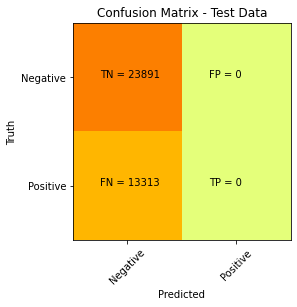

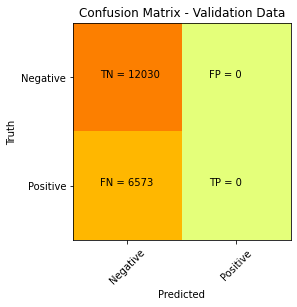

Training:
True positive rate: 0.000000
False positive rate: 0.000000

Validation:
True positive rate: 0.000000
False positive rate: 0.000000


In [226]:
models[model].predict()
models[model].get_confusion_matrix()
models[model].plot_confusion_matrix()
models[model].get_tpr_fpr()

print("Training:")

print("True positive rate: {:3f}".format(models[model].tpr_train))
print("False positive rate: {:3f}".format(models[model].fp_train))
print("")
print("Validation:")

print("True positive rate: {:3f}".format(models[model].tpr_val))
print("False positive rate: {:3f}".format(models[model].fp_val))


False positive rate is very low, this is good!

True positive rate is very low, this is bad.

The total propotion of positive predictions is very low, our model has simply learned to always predict negative at the default threshold which is 0.5. 

The ROC curve should help us better understand our performance across the full spectrum of thresholds.

### ROC Curve

This will be one of our key metrics going forward. The aim is to have a high area under the curve (AUC) score as possible. The closer the curve is to the top left of the graph, the better we are doing.

In [227]:
models[model].plot_roc()

The area under the curve is barely over 50%. We see that the curve is very close to the 50% baseline and our model is going to struggle to make predictions at any thresholds.

Interpreting this: ethnicity, age and gender are not (or, rather, are only very midly) predictive of the outcome of a stop and search in Scotland.

We need to get more signal from our model before we will be able to optimise our decision threshold. This would look like the ROC curve moving towards the top right corner.

What do the indidiual cofficients look like?

### Coefficients

In [228]:
coefficients = models[model].get_feature_weights()


Coefficents:
-4.27e-01: Nominal Ethnicity_Not Provided / Unknown
-2.28e-01: Nominal Ethnicity_White_Other
 1.90e-01: Nominal Ethnicity_South Asia
-1.41e-01: Nominal Ethnicity_White Scottish
 1.39e-01: Nominal Gender_Male
-1.26e-01: Nominal Ethnicity_Caribbean, African, Black
-8.81e-02: Nominal Ethnicity_White English
 7.41e-02: Nominal Ethnicity_Other
 6.51e-02: Nominal Ethnicity_White Polish
 1.51e-02: Nominal Ethnicity_White British
-9.65e-05: Nominal Age


Age seems to be having very little effect, how does the model perform without it?

In [229]:
model="ethnicity, gender"
cols = X_train_init.columns[X_train_init.columns.str.contains("Nominal Ethnicity.*", regex=True)].to_list()
cols += ["Nominal Gender_Male"]

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.642
Validation accuracy:0.642


AUC score is about the same, but the ROC graph is now consistently above the baseline of 0.5 and is less sensitive to threshold choice. This model should generally perform more consistently against real data.

What about Gender and Ethnicity Independently?

In [230]:
model="ethnicity"
cols = X_train_init.columns[X_train_init.columns.str.contains("Nominal Ethnicity.*", regex=True)].to_list()

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.642
Validation accuracy:0.642


In [231]:
model="gender"
cols = ["Nominal Gender_Male"]

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.642
Validation accuracy:0.642


It seems these two combined give the limited predictive power this model has, so we'll use this combination as a base to try and improve upon.

# Search Reason

Intuitively search reason seems like it could be a strong predictor and indeed it is. The total number of positive predictions has now doubled and our AUC ROC score has improved by 0.05%. This still going to be barely better than a coin toss, but is progress!

In [232]:
model="search reason"
cols = []

cols = X_train_init.columns[X_train_init.columns.str.contains("Nominal Ethnicity.*", regex=True)].to_list()
cols += X_train_init.columns[X_train_init.columns.str.contains("Search Reason.*", regex=True)].to_list()
cols += ["Nominal Gender_Male"]

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.642
Validation accuracy:0.642


## Location

The lowest level location (ward) is probably too small to be useful and would create around 350 different. Instead we'll try council area, and then move up the location levels in size order until they stop being useful.

council -> area -> division -> command

### 1 Council

In [233]:
model="council"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Council Desc")
cols += ["Nominal Gender_Male"]

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.645
Validation accuracy:0.645


### 2 Area

In [234]:
model="area"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init, "Area Command")

cols += ["Nominal Gender_Male"]

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.648
Validation accuracy:0.648


### 3 Division

In [235]:
model="division"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init, "Area Command")
cols += classification_tools.list_onehot_columns(X_train_init, "Division Desc")


X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.648
Validation accuracy:0.648


### 4 Commmand

In [236]:
model="command"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init, "Area Command")
cols += classification_tools.list_onehot_columns(X_train_init, "Division Desc")
cols += classification_tools.list_onehot_columns(X_train_init, "Command Desc")

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()


Training accuracy: 0.648
Validation accuracy:0.648


### Models Summary

In [237]:
print("Validation AUC ROC Score:\n")
for model_name, model in models.items():
    print("{}: {:.3f}".format(model_name,model.get_auc_roc()[1]))

print("Validation TPR/FPR:\n")
for model_name, model in models.items():
    print("{}: TPR {:.3f}, FPR {:.3f}".format(model_name,model.tpr_val, model.fpr_val))



Validation AUC ROC Score:

Age, Ethnicity, Gender: 0.511
ethnicity, gender: 0.510
ethnicity: 0.505
gender: 0.508
search reason: 0.555
council: 0.612
area: 0.622
division: 0.622
command: 0.622
Validation TPR/FPR:

Age, Ethnicity, Gender: TPR 0.000, FPR 0.000
ethnicity, gender: TPR 0.000, FPR 0.000
ethnicity: TPR 0.000, FPR 0.000
gender: TPR 0.000, FPR 0.000
search reason: TPR 0.002, FPR 0.001
council: TPR 0.089, FPR 0.044
area: TPR 0.122, FPR 0.060
division: TPR 0.129, FPR 0.067
command: TPR 0.129, FPR 0.067


The addition of "division" and "command" on top of "council" and "area" have not added any performance so we will not use these features for our model.

# Imbalanced Classes: Resampling

We are slowly improving, but the true positive rate remains stubbornly low and the false positive rate remains at about 50% that off the TPR, meaning around half our predictions are false positives, not great. Our model is still struggling to predict positive, which is our minority class. We could attempt some resampling to balance our classes. 

We will try SMOTE to oversample the minority class. Smote uses a KNN-like algorithm to create additional classes. We'll then try using random over-sampling of the majority class and compare results on our so-far-most-successful model: "area".

In our approach we shall resample only the training data, and leave the validation data as is so that we get validation results that are representative of our real data.

In [238]:
print("Initial positive label ratio: {:.2f}".format(y_train.value_counts()[1]/y_train.count()))

Initial positive label ratio: 0.36


In [239]:
#need to drop the time related columns as these are not properly encoded for inputing
X_train_init = X_train_init.drop(["Year", "Month", "Day of the Week", "Time of the Day"], axis=1)

## SMOTE

In [240]:
from imblearn.over_sampling import SMOTE

smote = SMOTE()
X_train_init_sm, y_train_sm = smote.fit_resample(X_train_init.copy(), y_train.copy())

print("Resampled positive label ratio: {:.2f}".format(y_train_sm.value_counts()[1]/y_train_sm.count()))

Resampled positive label ratio: 0.50


In [241]:
model="area_smote"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init_sm, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init_sm, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init_sm, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init_sm, "Area Command")



cols += ["Nominal Gender_Male"]

X_train = X_train_init_sm[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train_sm, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.636
Validation accuracy:0.636


We can see significant improvement to our metrics in the training data but this is not reflected in the validation data. It's possible we are now overfitting to the imputed oversampled data.

We could try applying regularisation to see if that reduces the variance.

In [242]:
model="area_smote"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init_sm, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init_sm, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init_sm, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init_sm, "Area Command")



cols += ["Nominal Gender_Male"]

X_train = X_train_init_sm[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train_sm, y_val, cols, max_iter=1000, n_jobs=n_jobs, penalty="l2")
models[model].analyse()

Training accuracy: 0.636
Validation accuracy:0.636


This hasn't helped, there still exists a significant gap in performance from our training to our validation set, and our validation performance is comparable to that we achieved pre-SMOTE, it is in fact slightly worse.

## Random Under Sampling

In [243]:
from imblearn.under_sampling import RandomUnderSampler

rus = RandomUnderSampler(random_state=0)
X_train_init_rus, y_train_rus = rus.fit_resample(X_train_init.copy(), y_train.copy())

print("Resampled positive label ratio: {:.2f}".format(y_train_rus.value_counts()[1]/y_train_rus.count()))

Resampled positive label ratio: 0.50


In [244]:
model="area_rus"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init_sm, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init_sm, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init_sm, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init_sm, "Area Command")

cols += ["Nominal Gender_Male"]

X_train = X_train_init_rus[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train_rus, y_val, cols, max_iter=1000, n_jobs=n_jobs, penalty="l2")
models[model].analyse()

Training accuracy: 0.590
Validation accuracy:0.590


This is near identitical AUC ROC training and validation performance. 

This is now perhaps pointing us towards that the imbalance in our classes is not the cause of our poor performance. It might be possible to some more high variance strategies with SMOTE to bring the training and validation performances closer together, though it is probably not a good use of time.

We'll not continue to use either of these methods.

# Search Statue

There is just one last feature in the stop and search dataset we haven't used: "Search Statue". It's not clear whether this should be used as a predictor as it could just be the formal powers behind "search reason". Nevertheless, let us see if it improves our model.

In [245]:
model="search_statue"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init, "Area Command")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Statute")
cols += ["Nominal Gender_Male"]

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.649
Validation accuracy:0.649


Barely an improvement, probably not significant, and given how closely aligned this is with search reason, we will exclude this feature for simplicity.

# SIMD

We have no more stop and search features to explore so now we will begin adding SIMD features one domain at a time.

## Population

In [246]:
model="population"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init, "Area Command")
cols += ["Nominal Gender_Male", "Working_Age_population", "Total_population"]

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.642
Validation accuracy:0.642


Adding in the population columns has made the model much, much worse! These are very large numbers and it's possible that they are dominating the other features in the regression. We'll try using popoluation divided by 10,000.

In [247]:
X_train_init.loc[:,["Working_Age_population_10000"]] = X_train_init["Working_Age_population"]/10000
X_train_init.loc[:,["Total_population_10000"]] = X_train_init["Total_population"]/10000
X_val_init.loc[:,["Working_Age_population_10000"]] = X_val_init["Working_Age_population"]/10000
X_val_init.loc[:,["Total_population_10000"]] = X_val_init["Total_population"]/10000

In [248]:
model="population_10000"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init, "Area Command")
cols += ["Nominal Gender_Male", "Working_Age_population_10000", "Total_population_10000"]

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.648
Validation accuracy:0.648


The rescaling has worked. It is not really an improvement but it might interplay with other features we are adding in a useful way. We will come back to population at the end and re-evaluate it's contribution

## Crime

Crime seems like an obvious choice given we are looking at stop and search.

In [249]:
model="crime"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init, "Area Command")
cols += ["Nominal Gender_Male", "Working_Age_population_10000", "Total_population_10000"]
#crime
cols += ['crime_count_log']

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.648
Validation accuracy:0.648


## Income

In [250]:
model="income"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init, "Area Command")
cols += ["Nominal Gender_Male", "Working_Age_population_10000", "Total_population_10000"]
#crime
cols += ['crime_count_log']
#income
cols += [ 'income_count_log' ]

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.648
Validation accuracy:0.648


## Employment

In [251]:
model="employment"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init, "Area Command")
cols += ["Nominal Gender_Male", "Working_Age_population_10000", "Total_population_10000"]
#crime
cols += ['crime_count_log']
#income
cols += [ 'income_count_log' ]
# employment
cols += ["employment_count_log"]

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.648
Validation accuracy:0.648


## Health

In [252]:
model="health"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init, "Area Command")
cols += ["Nominal Gender_Male", "Working_Age_population_10000", "Total_population_10000"]
#crime
cols += ['crime_count_log']
#income
cols += [ 'income_count_log' ]
# employment
cols += ["employment_count_log"]
# health
cols += [ 'CIF', 'ALCOHOL', 'DRUG', 'SMR', 'DEPRESS', 'LBWT', 'EMERG']

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.648
Validation accuracy:0.648


## Access

In [253]:
model="access"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init, "Area Command")
cols += ["Nominal Gender_Male", "Working_Age_population_10000", "Total_population_10000"]
#crime
cols += ['crime_count_log']
#income
cols += [ 'income_count_log' ]
# employment
cols += ["employment_count_log"]
# health
cols += [ 'CIF', 'ALCOHOL', 'DRUG', 'SMR', 'DEPRESS', 'LBWT', 'EMERG']
# access
cols += [ 'drive_petrol_log', 'drive_GP_log', 'drive_post_log', 'drive_primary_log', 'drive_retail_log', 'drive_secondary_log', 'PT_GP_log', 'PT_post_log', 'PT_retail_log', 'broadband_log' ]

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.647
Validation accuracy:0.647


## Housing

In [254]:
model="housing"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init, "Area Command")
cols += ["Nominal Gender_Male", "Working_Age_population_10000", "Total_population_10000"]
#crime
cols += ['crime_count_log']
#income
cols += [ 'income_count_log' ]
# employment
cols += ["employment_count_log"]
# health
cols += [ 'CIF', 'ALCOHOL', 'DRUG', 'SMR', 'DEPRESS', 'LBWT', 'EMERG']
# access
cols += [ 'drive_petrol_log', 'drive_GP_log', 'drive_post_log', 'drive_primary_log', 'drive_retail_log', 'drive_secondary_log', 'PT_GP_log', 'PT_post_log', 'PT_retail_log', 'broadband_log' ]
# housing
cols += [ 'overcrowded_count_log', 'nocentralheating_count_log']

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.647
Validation accuracy:0.647


## Education

In [255]:
model="edu"
cols = []

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Council Desc")
cols += classification_tools.list_onehot_columns(X_train_init, "Area Command")
cols += ["Nominal Gender_Male", "Working_Age_population_10000", "Total_population_10000"]
#crime
cols += ['crime_count_log']
#income
cols += [ 'income_count_log' ]
# employment
cols += ["employment_count_log"]
# health
cols += [ 'CIF', 'ALCOHOL', 'DRUG', 'SMR', 'DEPRESS', 'LBWT', 'EMERG']
# access
cols += [ 'drive_petrol_log', 'drive_GP_log', 'drive_post_log', 'drive_primary_log', 'drive_retail_log', 'drive_secondary_log', 'PT_GP_log', 'PT_post_log', 'PT_retail_log', 'broadband_log' ]
# housing
cols += [ 'overcrowded_count_log', 'nocentralheating_count_log']
# education
cols +=  ['Attendance', 'Attainment', 'no_qualifications', 'not_participating']

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()

Training accuracy: 0.648
Validation accuracy:0.648


In [256]:
model_names = ["population_10000", "crime", "income", "employment", "health", "access", "housing", "edu"]

print("Validation AUC ROC Score:\n")
for model_name in model_names:
    model = models[model_name]
    print("{}: {:.4f}".format(model_name,model.get_auc_roc()[1]))
print("")
print("Validation TPR/FPR:\n")
for model_name in model_names:
    model = models[model_name]
    print("{}: TPR {:.3f}, FPR {:.3f}".format(model_name,model.tpr_val, model.fpr_val))



Validation AUC ROC Score:

population_10000: 0.6223
crime: 0.6233
income: 0.6232
employment: 0.6230
health: 0.6231
access: 0.6237
housing: 0.6237
edu: 0.6224

Validation TPR/FPR:

population_10000: TPR 0.120, FPR 0.059
crime: TPR 0.123, FPR 0.062
income: TPR 0.123, FPR 0.062
employment: TPR 0.123, FPR 0.062
health: TPR 0.126, FPR 0.063
access: TPR 0.117, FPR 0.057
housing: TPR 0.117, FPR 0.058
edu: TPR 0.118, FPR 0.057


Essentially, none of the SIMD data has predictive power. Any improvements in AUC score are in the 3rd/4th decimal place.

We will go back to our "area" model as our leading logistic regression model.

# Optimisation

Let us look again at our current best performing model, which contains Ethnicity, Search Reason, Area Command and Gender.

Looking closely at the features and their weights, it seems area and council are very closely aligned, with only the bigger cities having their council areas split into smaller area commands. Can we remove council area and get the same performace?

In [257]:
model="area"

models[model].analyse()
print("")
models[model].get_feature_weights()


Training accuracy: 0.648
Validation accuracy:0.648



Coefficents:
 3.04e+01: Search Reason_Warrant
 3.03e+01: Search Reason_Stolen Property
 3.00e+01: Search Reason_Drugs
 2.96e+01: Search Reason_Protection Of Life
 2.95e+01: Search Reason Firearms/Crossbows
 2.95e+01: Search Reason_Weapons
 2.93e+01: Search Reason Other Reason
 2.87e+01: Search Reason_Care & Welfare
-5.48e+00: Council Desc_Glasgow City
-5.23e+00: Council Desc_City of Edinburgh
-5.15e+00: Council Desc_South Lanarkshire
-5.02e+00: Council Desc_North Lanarkshire
-4.80e+00: Council Desc_Highland
-4.60e+00: Council Desc_Aberdeenshire
-4.57e+00: Council Desc_Argyll & Bute
-4.50e+00: Council Desc_Aberdeen City
-4.47e+00: Council Desc_Dumfries & Galloway
-4.44e+00: Council Desc_Fife
-4.35e+00: Council Desc_Renfrewshire
-3.81e+00: Council Desc_Inverclyde
-3.81e+00: Area Command Desc_Inverclyde - KC
-3.57e+00: Council Desc_Shetland Islands
-3.57e+00: Area Command Desc_Shetland - NL
-3.45e+00: Council Desc_West Dunbartonshire
-3.45e+00: Area Command Desc_West Dunbartonshire - LA


In [258]:
model="area_only"
cols = []
importlib.reload(classification_tools)

cols += classification_tools.list_onehot_columns(X_train_init, "Nominal Ethnicity")
cols += classification_tools.list_onehot_columns(X_train_init, "Search Reason")
cols += classification_tools.list_onehot_columns(X_train_init, "Area Command")
cols += ["Nominal Gender_Male"]

X_train = X_train_init[cols]
X_val = X_val_init[cols]

models[model] = classification_tools.BinaryLogisticClassifier(X_train, X_val, y_train, y_val, cols, max_iter=1000, n_jobs=n_jobs)
models[model].analyse()
models[model].get_feature_weights()

Training accuracy: 0.648
Validation accuracy:0.648


Coefficents:
 4.35e+01: Search Reason_Warrant
 4.35e+01: Search Reason_Stolen Property
 4.32e+01: Search Reason_Drugs
 4.28e+01: Search Reason_Protection Of Life
 4.27e+01: Search Reason Firearms/Crossbows
 4.26e+01: Search Reason_Weapons
 4.25e+01: Search Reason Other Reason
 4.18e+01: Search Reason_Care & Welfare
-5.75e+00: Area Command Desc_Inverclyde - KC
-5.37e+00: Area Command Desc_Hamilton - QB
-5.28e+00: Area Command Desc_Shetland - NL
-5.14e+00: Area Command Desc_Cowal, Bute & Helensburgh - LD
-5.13e+00: Area Command Desc_Aberdeenshire North - AP
-5.03e+00: Area Command Desc_West Dunbartonshire - LA
-5.03e+00: Area Command Desc_Galloway - VG
-5.02e+00: Area Command Desc_Renfrew - KB
-5.00e+00: Area Command Desc_Wishaw Motherwell and Bellshill - QE
-4.93e+00: Area Command Desc_Aberdeenshire South - AV
-4.91e+00: Area Command Desc_Orkney - NK
-4.91e+00: Area Command Desc_Aberdeen North - AK
-4.87e+00: Area Command Desc_Aberdeen South - AU
-4.87e+00: Area Command Desc_Edinburgh S

It seems we can, great, we have simplified our model.

Training accuracy: 0.648
Validation accuracy:0.648


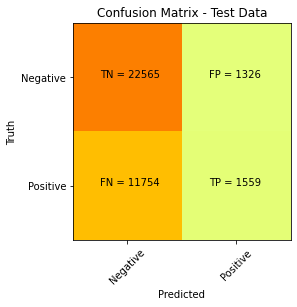

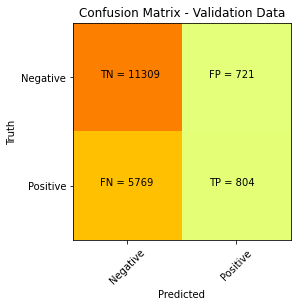

        Data |  TPR  |  FPR  |  TNR  |  FNR 
    Training | 0.117 | 0.056 | 0.944 | 0.883
  Validation | 0.122 | 0.060 | 0.940 | 0.878
Positive Prediction Rate: 0.082


In [259]:
#Positive prediction rate
models[model].analyse(ROC=False, threshold=0.5, conf_matrix=True)
ppr = (models[model].fp_val + models[model].tp_val) / models[model].y_val.count()
print("Positive Prediction Rate: {:.3f}".format(ppr))

In [260]:
#Positive prediction rate
ppr = (models[model].fp_val + models[model].tp_val) / models[model].y_val.count()
print("Positive Prediction Rate: {:.3f}".format(ppr))

Positive Prediction Rate: 0.082


At the default threshold (0.5) our model is struggling to make any positive predictions, though our ROC curve suggests that if we adjust it we will get more.

We can calculate some key metrics at a range of thresholds to help us choose a threshold.

In [296]:
from sklearn.metrics import f1_score

thresholds = np.arange(0,0.7,0.005)
df_threshold = pd.DataFrame()

for threshold in thresholds:
    models[model].analyse(verbose=False, threshold=threshold)
    precision = models[model].tp_val / (models[model].tp_val + models[model].fp_val)
    npv = models[model].tn_val / (models[model].fn_val + models[model].tn_val)
    df_threshold = df_threshold.append({
        "threshold":threshold, 
        "TPR": models[model].tpr_val, 
        "FPR": models[model].fpr_val, 
        "FNR": models[model].fnr_val,
        "TNR": models[model].tnr_val,
        "F1": f1_score(models[model].y_val, models[model].y_val_pred), 
        "precision": precision,
        "npv": npv,
        "FPR + FNR": models[model].fnr_val + models[model].fpr_val
        }, ignore_index=True)

df_threshold = df_threshold.set_index("threshold")
    

<ipython-input-296-b1d29b9add4b>:9: RuntimeWarning:

invalid value encountered in long_scalars

<ipython-input-296-b1d29b9add4b>:9: RuntimeWarning:

invalid value encountered in long_scalars

<ipython-input-296-b1d29b9add4b>:9: RuntimeWarning:

invalid value encountered in long_scalars

<ipython-input-296-b1d29b9add4b>:9: RuntimeWarning:

invalid value encountered in long_scalars

<ipython-input-296-b1d29b9add4b>:9: RuntimeWarning:

invalid value encountered in long_scalars

<ipython-input-296-b1d29b9add4b>:9: RuntimeWarning:

invalid value encountered in long_scalars

<ipython-input-296-b1d29b9add4b>:9: RuntimeWarning:

invalid value encountered in long_scalars

<ipython-input-296-b1d29b9add4b>:9: RuntimeWarning:

invalid value encountered in long_scalars

<ipython-input-296-b1d29b9add4b>:9: RuntimeWarning:

invalid value encountered in long_scalars



In [297]:
import plotly.graph_objects as go
import plotly.express as px

metrics_to_plot = ["precision", "F1", "FPR + FNR", "FPR", "FNR"]

fig = px.line(
    df_threshold,
    y = metrics_to_plot,
    labels={
        "variable":"Metric",
        "threshold":"Threshold",
        "value":"Value"
        },
        title="Model Metrics"
    )

fig.show()


We had previously said we care approximately equally about our false positives and false negatives and so it makes sense to consider not the individual rates but the sum of these to find our threshold. We see an inflection point at a threshold of around 0.36. This is also the region where our F1 score begins to decrease quickly and so this seems like the best choice we have.

Training accuracy: 0.648
Validation accuracy:0.648


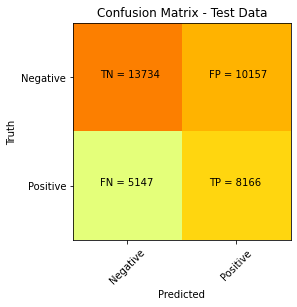

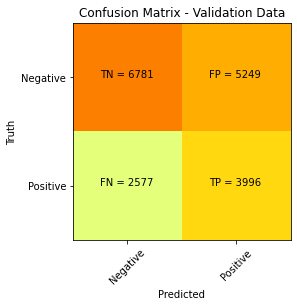

        Data |  TPR  |  FPR  |  TNR  |  FNR 
    Training | 0.613 | 0.425 | 0.575 | 0.387
  Validation | 0.608 | 0.436 | 0.564 | 0.392


F1           0.505247
FNR          0.392058
FPR          0.436326
FPR + FNR    0.828384
TNR          0.563674
TPR          0.607942
npv          0.724621
precision    0.432234
Name: 0.36, dtype: float64

In [298]:
threshold = 0.36
models[model].analyse(ROC=False, threshold=threshold, conf_matrix=True)
df_threshold.loc[threshold]

At this threshold we have a Precision of 60% i.e. if we predict positive, it will actually be positive 6/10 times. 4/10 times it will be a false positive.

If we predict negative we will be correct 72% of the time, 28% of the time we will predict a false negative.

The model does poorly at predicting positives, but does a better job of correctly prediciting negative results, though this is probably a consequence of the inbalance in our data (~2/3rds negative outcomes) and having a tendancy to predictive negative.

Given the possible real world, street level consequences of false positive and false negative predictions, I would be reluctant to recomend deploying any model unless it was performing exceptionally well, which this one is not.


# Interpretation

## What the Model Doesn't Say

Before we discuss what we can learn from our model, it is important to state what the model does not tell us.

- It does not, and can not, tell us anything about who gets stopped or why. It can only tell us about what happens once someone has been stopped.
- It does not say anything about the number of positive or negative stop and searches for a particular area or group of people, only the rate at which the outcome is positive or negative.

## What the Model Does Say

Although the model is not performing well, it does tell us a number of useful things.

1. The outcome of stop search is almost entirely independent of age, ethnicity, gender or any of the deprivation factors. This is a good news story, and suggests that whatever tactics the police are using to target stop and search activity, the outcomes are not discrimitatory.
2. The biggest single predictor is the reason for the stop, with "warrant" and "stolen property" being most likely to produce a positive outcome.
3. Area command is the only other influence from the factors we have had available. There could be any number of reasons for this, inculding: 
    - differing policy within a policing our council region
    - prevelance of certain types of crime/activity (although the crime rate did not seem to be a good predictor, we did not have a feature that old us about rate of different types of crime)
    - or any other myriad range of factors that very from area to area that were not captured in any of our available data

Given the factors discussed above about model performance, I would not make any specific recomendations about the groups of people or types of crime to target stop and search activity at. However, given that area seems to have at least some predictive power, it may be useful for someone with more familiar knowledge of the subject to dig further into this and see if the underlying causes can be established and any lessons learned.